In [3]:
%load_ext autoreload
%autoreload 2

In [2]:
%%time

import sys
import warnings
warnings.filterwarnings('ignore')
sys.path.append('..')
from utils import featurize, update_vars
import scanpy as sc
from modules.vae import JointVAE
from torch import optim
from modules.losses import Loss
from early_stopping import EarlyStopping
from tqdm import tqdm
import numpy as np
import seaborn as sns
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import scale
from scipy.stats import spearmanr
import squidpy as sq
import math
from leiden_clustering import LeidenClustering
from anndata import AnnData
import pandas as pd
from sklearn.decomposition import PCA
from utils import train_test_split
from modules.losses import Metrics
from modules.losses import LossFunctions
from plotting import plot_latent, plot_umap_grid
from utils import euclidean_distance
from plotting import plot_latent
import uniport as up
import umap.umap_ as cuml
from matplotlib.colors import ListedColormap
from scipy.spatial import distance_matrix

torch.manual_seed(1)
np.random.seed(1)

CPU times: user 7.13 ms, sys: 2.78 ms, total: 9.91 ms
Wall time: 61.9 ms


In [3]:
hex_colors =  ["#4a3e38",
"#9fbfa2",
"#b99bbd",
"#53366c",
"#b2834b",
"#00612e",
"#00acef",
"#00eee9",
"#ba4850",
"#cac84d",
"#ce52ad",
"#76d05c",
"#794bc8",
"#e85a00"]

colors = ListedColormap(sns.color_palette(hex_colors))
# colors

In [4]:
adata_ref = sc.read_h5ad('./adata/tonsil_cytassist.h5ad')
antibody_panel = pd.read_csv('antibody_panel.csv')

In [5]:
tissue = 'Tonsil'
adata = sc.read_10x_h5(f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX/filtered_feature_bc_matrix.h5', gex_only=False)
visium_ = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX/')
adata.uns['spatial'] = visium_.uns['spatial']
adata.obsm['spatial'] = visium_.obsm['spatial']
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
adata = adata[adata.obs["pct_counts_mt"] < 20]
adata = adata[:, adata.var["mt"] == False]
pdata = adata[:, adata.var.feature_types=='Antibody Capture']
adata = adata[:, adata.var.feature_types=='Gene Expression']
pdata.var["isotype_control"] = (pdata.var_names.str.startswith("mouse") | pdata.var_names.str.startswith("rat") | pdata.var_names.str.startswith("HLA"))
pdata = pdata[:, pdata.var.isotype_control==False]
adata.layers['counts'] = adata.X
pdata.layers['counts'] = pdata.X
adata.var_names_make_unique()
adata.shape, pdata.shape

((4194, 18074), (4194, 30))

In [6]:
adata2 = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX')
adata2.obsm['spatial'] = adata2.obsm['spatial'].astype(float)
adata2.layers['counts'] = adata2.X
adata2.var_names_make_unique()

In [7]:
adata.obs['source'] = 'CytAssist'
adata.obs['domain_id'] = 0
adata.obs['domain_id'] = adata.obs['domain_id'].astype('category')
adata2.obs['source'] = '10X Visium'
adata2.obs['domain_id'] = 1
adata2.obs['domain_id'] = adata2.obs['domain_id'].astype('category')
adata_cm = adata.concatenate(adata2, join='inner')

In [8]:
n_top_genes = 5000

sc.pp.normalize_total(adata_cm)
sc.pp.log1p(adata_cm)
hvg = sc.pp.highly_variable_genes(adata_cm, n_top_genes=n_top_genes, inplace=False, subset=False)
adata_cm = adata_cm[:, adata_cm.var_names.isin(pdata.var_names) | hvg.highly_variable]
up.batch_scale(adata_cm)

In [9]:
adata = adata_cm[adata_cm.obs.domain_id==0]
adata2 = adata_cm[adata_cm.obs.domain_id==1]
adata.shape, adata2.shape

((4194, 5009), (4035, 5009))

In [10]:
# adata_cm = AnnData.concatenate(adata, adata2, join='inner')
# adatax = up.Run(name=tissue, adatas=[adata, adata2], adata_cm=adata_cm, lambda_s=1.0, out='latent', ref_id=0)

In [11]:
# plt.rcParams['figure.figsize'] = [7, 7]
# red = cuml.UMAP(
#     n_components=2,
#     n_neighbors=20,
#     min_dist=.1,
#     random_state=42
# )
# red.fit(adatax.obsm['latent'])
# plot_data = red.transform(adatax.obsm['latent'])
# sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=adatax.obs.source, edgecolor='black', s=65)
# plt.show()

In [12]:
adata_cm = AnnData.concatenate(adata, adata2, join='inner')
adata_new = up.Run(name=tissue, adatas=[adata2, adata], adata_cm =adata_cm, lambda_s=1.0, out='project')

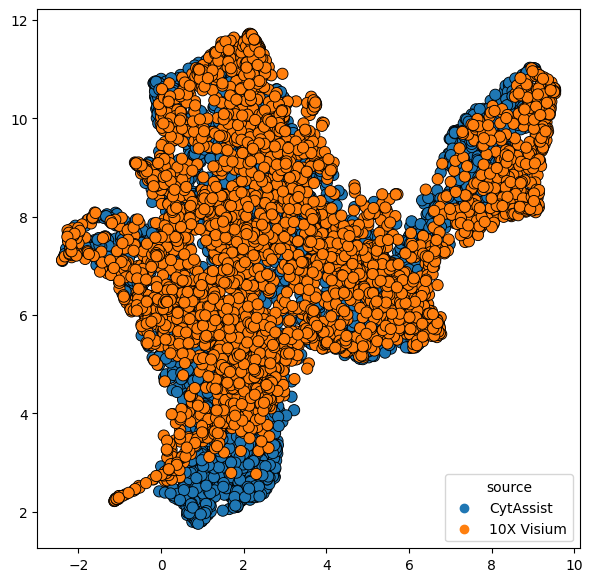

In [13]:
plt.rcParams['figure.figsize'] = [7, 7]
red = cuml.UMAP(
    n_components=2,
    n_neighbors=20,
    min_dist=.1,
)
red.fit(adata_new.obsm['project'])
plot_data = red.transform(adata_new.obsm['project'])
sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=adata_new.obs.source, edgecolor='black', s=65)
plt.show()

In [20]:
# sc.pp.neighbors(adata_new, use_rep='project')
# sc.tl.umap(adata_new, min_dist=0.2)
# sc.pl.umap(adata_new, color=['source'])

In [21]:
# adata_10x = sc.read_h5ad('uniPort_10x_visium.h5ad')
# adata_cyt = sc.read_h5ad('uniPort_cytassist.h5ad')

In [22]:
# adatax.obs['in_tissue'] =  adatax.obs['in_tissue'].astype(int)
# adatax.obs['array_col'] = adatax.obs['array_col'].astype(int)
# adata_10x = adatax[adatax.obs.source=='10X Visium']
# adata_cyt = adatax[adatax.obs.source=='CytAssist']

In [23]:
# adata_10x.write('uniPort_10x_visium.h5ad')
# adata_cyt.write('uniPort_cytassist.h5ad')

In [24]:
# sc.pp.neighbors(adatax, use_rep='latent')
# sc.tl.umap(adatax, min_dist=0.2)

In [25]:
# plt.rcParams['figure.figsize'] = [6, 6]
# labels = ['CytAssist', '10X Visium']
# for ii in [0, 1]:
#     data = adatax[adatax.obs.domain_id==f'{ii}']
#     red = cuml.UMAP(
#         n_components=2,
#         n_neighbors=100,
#         min_dist=0.1,
#         random_state=42
#     )
#     red.fit(data.X.toarray())
#     plot_data = red.transform(data.X.toarray())
#     cmap =  ListedColormap(sns.color_palette("husl", 256).as_hex())
#     sns.scatterplot(plot_data[:, 0], plot_data[:, 1], label=labels[ii])

# plt.legend()
# # plt.savefig('./figures/uniport_platforms.svg', format='svg', dpi=180)
# plt.show()

In [26]:
# plt.rcParams['figure.figsize'] = [6, 6]
# red = cuml.UMAP(
#     n_components=2,
#     n_neighbors=20,
#     min_dist=.1,
#     random_state=42
# )
# red.fit(adatax.obsm['latent'])
# plot_data = red.transform(adatax.obsm['latent'])
# sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=adatax.obs.source)

# # plt.savefig('./figures/uniport_integrated.svg', format='svg', dpi=180)
# plt.show()

In [14]:
adata_10x = adata_new[adata_new.obs.source=='10X Visium']
adata_cyt = adata_new[adata_new.obs.source=='CytAssist']

In [15]:
adata_cyt.obs['celltype'] = adata_ref.obs.celltype.values

In [16]:
labels_cyt = adata_ref.obs.celltype.values

In [17]:
type1 = adata_ref.obs.celltype.values

In [18]:
adatax = adata_cyt.concatenate(adata_10x, join='inner', batch_key='domain_id')
adatax.obsm['latent'] = adatax.obsm['project']

red = cuml.UMAP(
        n_components=2,
        n_neighbors=50,
        min_dist=0.1,
        random_state=42
    )

red.fit(adatax.obsm['latent']);
# red.fit(adatax.X.toarray());

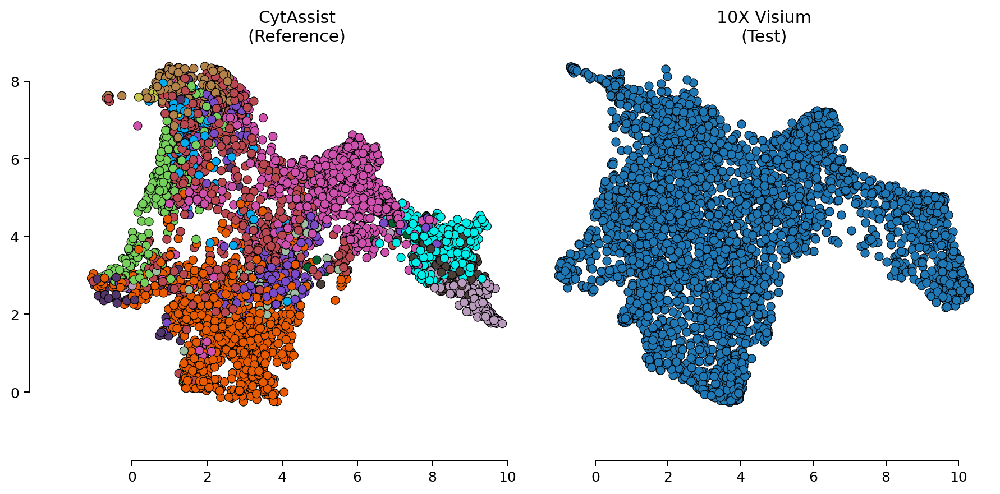

In [19]:
f, axs = plt.subplots(1, 2, figsize=(10, 5), dpi=180)

ii = 0
data = adatax[adatax.obs.domain_id==f'{ii}']    
plot_data = red.transform(data.obsm['latent'])
# plot_data = red.transform(data.X.toarray())

scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=[labels_cyt, []][ii], ax=axs[ii], 
                          edgecolor='black', palette=dict(zip(type1.categories, hex_colors)), color='r', legend=False)
ax = axs[ii]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('CytAssist\n(Reference)')

ii = 1
data = adatax[adatax.obs.domain_id==f'{ii}']    
plot_data = red.transform(data.obsm['latent'])
# plot_data = red.transform(data.X.toarray())

# scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], ax=axs[ii], color='grey', legend=False, edgecolor='black')
scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], ax=axs[ii], hue=None, legend=False, edgecolor='black', 
                          palette=dict([(k, v) if k in ['Naive B Cells', 'Light Zone Region', 'Plasma B Cells', 'T Cell Enriched'] else (k, v) for k, v in dict(zip(type1.categories, hex_colors)).items()]))

ax = axs[ii]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('10X Visium\n(Test)')
    
axs[1].spines['left'].set_visible(False)
axs[1].yaxis.set_ticks([])
plt.tight_layout()

# plt.savefig('./figures/deconvolution_5.svg', format='svg', dpi=180)
plt.show()

In [20]:
pdata.obsm['spatial'] = adata.obsm['spatial']
pdata.raw = pdata
pdata.X = pdata.X.astype(float)
data11 = adata.X.toarray()
data12 = pdata.X.toarray()
sc.tl.pca(pdata)
sc.pp.neighbors(pdata)
sc.tl.leiden(pdata, resolution=0.3)
type1 = pdata.obs.leiden.values
type2 = pdata.obs.leiden.values

In [22]:
gex = featurize(adata)
gex2 = featurize(adata2)
pex = featurize(pdata, clr=False)
d11, d12 = gex.features.cpu().numpy(), pex.features.cpu().numpy()
d12 = pex.features.cpu().numpy()
d11.shape, d12.shape

((4194, 5009), (4194, 30))

In [23]:
# protein = d12
# rna = adata.to_df()[pdata.var_names].values

# f, axs = plt.subplots(5, 6, figsize=(23, 18), dpi=120, sharex=True, sharey=True)
# axs = axs.flatten()
# for ix, ax in enumerate(axs):
#     ax.plot([-0.1, 1.3], [-0.1, 1.3], color='red', alpha=0.5, linestyle='--')
#     sns.scatterplot(x=rna[:, ix], y=protein[:, ix], ax=ax, edgecolor='black', s=60, color=hex_colors[1])
    
#     ax.set_xlim(-0.2, 1.4)
#     ax.set_ylim(-0.2, 1.4)
    
#     ax.set_title(f'{pdata.var_names[ix]}\nCORR: {spearmanr(rna[:, ix], protein[:, ix]).statistic:.2f}', fontsize=11)
#     ax.set_xlabel('Measured Protein\n(Normalized)', fontsize=9)
#     ax.set_ylabel('Measured mRNA\n(Normalized)', fontsize=9)
    
    
# plt.show()

In [24]:
d11 = adatax[adatax.obs.domain_id=='0'].obsm['latent']
d14 = adatax[adatax.obs.domain_id=='1'].obsm['latent']

In [27]:
d14 = adatax[adatax.obs.domain_id=='1'].obsm['latent']
d14 = torch.tensor(d14).float()

In [28]:
adata.obs['celltype'] = adata_ref.obs['celltype'].values

In [29]:
d11.shape, d12.shape, d14.shape

((4194, 16), (4194, 30), torch.Size([4035, 16]))

In [30]:
type1, type2 = adata.obs.celltype.values, adata.obs.celltype.values

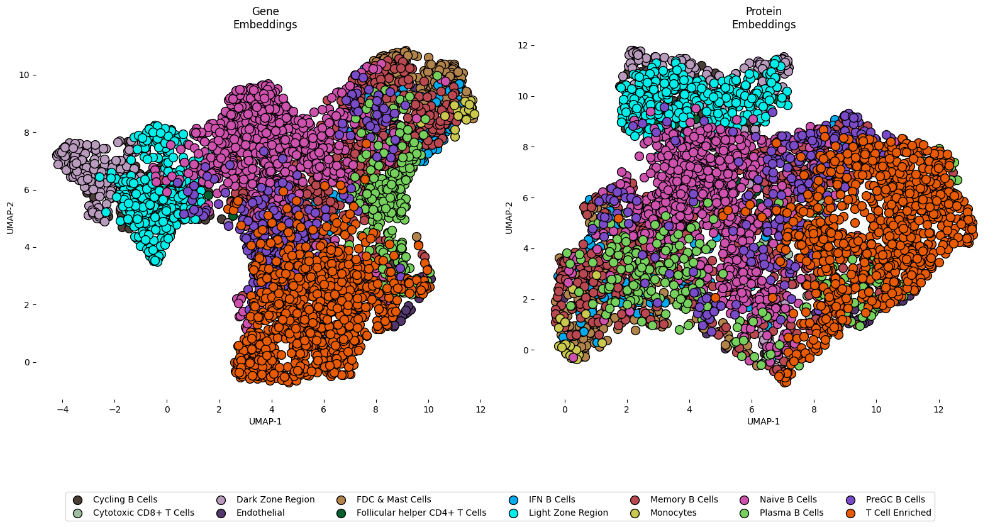

In [31]:
plot_latent([d11, d12], [type1, type2], separate_dim=True, legend=True, n_neighbors=50);

In [32]:
from modules.losses import Metrics, MultiTaskLoss
from modules.vae_infomax import InfoMaxVAE
from utils import train_test_split

In [33]:
train_test_split(adata)

In [34]:
train = [0, 1, 2, 3, 4]
test = [5, 6, 7, 8]

train_idx = adata[adata.obs['train_test'].isin(train)].obs.idx.values
test_idx = adata[adata.obs['train_test'].isin(test)].obs.idx.values

train_idx = test_idx = np.array(adata.obs.idx.values)
len(train_idx), len(test_idx)

(4194, 4194)

In [35]:
d12t = d12[test_idx, :]
d11t = d11[test_idx, :]
d12 = d12[train_idx, :]
d11 = d11[train_idx, :]

In [36]:
d11 = torch.tensor(d11).float()
d11t = torch.tensor(d11t).float()
d12 = torch.tensor(d12).float()
d12t = torch.tensor(d12t).float()
d14 = torch.tensor(d14).float()

In [37]:
# np.random.shuffle(d11)
# np.random.shuffle(d11t)

In [47]:
model = InfoMaxVAE([d11.shape[1], d12.shape[1]], latent_dim=64, encoder_dim=64)
es = EarlyStopping(patience=100, verbose=False, delta=0)
optimizer = optim.Adam(model.parameters(), lr=2e-3, weight_decay=0)
epochs = 1500
loss_func = Loss(max_epochs=epochs)
metrics = Metrics(track=False)
loss_func.alpha = {
    'kl_gex': 1e-2,
    'kl_pex': 1e-2,
    'recons_gex': 1e-1,
    'recons_pex': 1e-2,
    'cosine_gex': 1e-3,
    'cosine_pex': 1e-3,
    'adj': 1e-6,
    'spatial': 1e-5,
    'mutual_gex': 1e-3,
    'mutual_pex': 1e-3    
}

In [40]:
losses = []
embeds = []
feats = d11t[:, :].data.cpu().numpy()
feats2 = d12t[:, :].data.cpu().numpy()
dist = []


A = gex.adj_norm.to_dense()[train_idx][:, train_idx]
# A = corr
# np.random.shuffle(A)

try:
    with tqdm(total=epochs) as pbar:
        for e in range(epochs):

            model.train()
            optimizer.zero_grad()

            output = model(X=[d11, d12], A=A)            
            
            output.epochs = epochs
            output.adj_label = gex.adj_label[train_idx][:, train_idx]
            output.pos_weight = gex.pos_weight
            output.gex_sp_dist = gex.sp_dists[train_idx][:, train_idx]
            output.corr = gex.adj_label[train_idx][:, train_idx]
            output.norm = gex.norm

            buffer = loss_func.compute(e, output)
            loss = metrics(buffer).sum()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1)
            optimizer.step()
            losses.append(float(loss))


            model.eval()
            At = gex.adj_norm.to_dense()[test_idx][:, test_idx]
            output = model(X=[d11t, d12t], A=At) 
            pex_recons = output.pex_recons.data.cpu().numpy()
            pex_cor_mean = np.mean([spearmanr(feats2[:, ixs], pex_recons[:, ixs]).statistic for ixs in range(pex_recons.shape[1])])
            metrics.update_value('pex_corr', pex_cor_mean)

            proteins = model.impute(d11t, At)
            oracle_corr = np.mean([spearmanr(feats2[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])
            metrics.update_value('oracle', oracle_corr, track=True)

            # integrated_data =  model(X=[d11, d12], A=A)
            # gex_z = integrated_data.gex_z.data.cpu().numpy()[:50, :]
            # pex_z = integrated_data.pex_z.data.cpu().numpy()[:50, :]
            # a, b = plot_latent([gex_z, pex_z], [type1[:50], type2[:50]], reduce_only=True);
            # dist = np.mean([euclidean_distance(ai, bi) for ai, bi in zip(a, b)])
            # metrics.update_value('dist', dist)  

            cosine_loss = 0.5*(metrics.means.cosine_loss_gex + metrics.means.cosine_loss_pex)
            
            es(1-oracle_corr, model)
            if es.early_stop or e==511: 
                model = es.best_model
                break

            pbar.update()        
            pbar.set_description(f'Oracle: {metrics.means.oracle:.3f} | PEX: {np.mean(metrics.means.pex_corr):.3f} | Cosine: {cosine_loss:.3g} ')  
            
except Exception as e:
    # raise e
    print('[!] Interrupted')   

Oracle: 0.194 | PEX: 0.279 | Cosine: 0.000952 :   8%|▊         | 121/1500 [03:06<35:30,  1.55s/it] 


KeyboardInterrupt: 

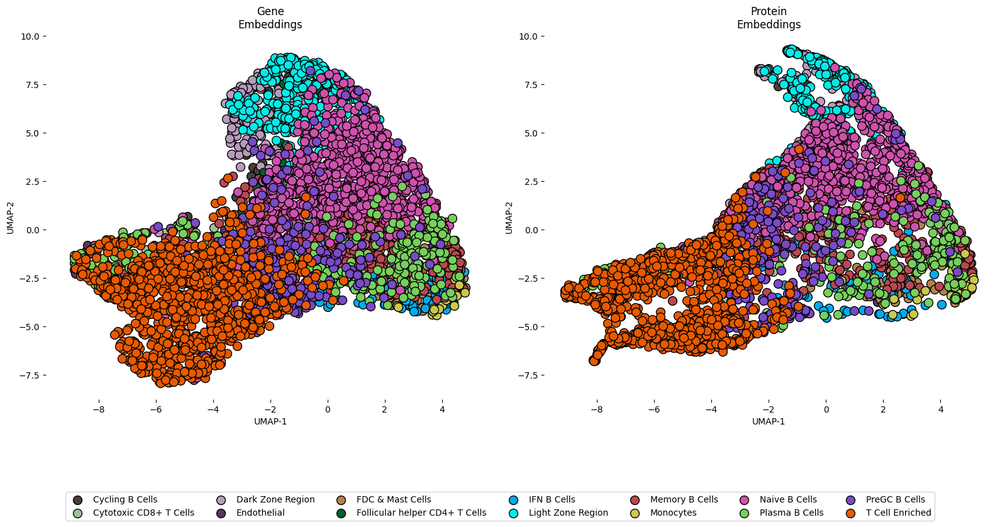

In [157]:
model = es.best_model
model.eval()
integrated_data =  model(X=[d11, d12], A=A)
gex_z = integrated_data.gex_z.data.cpu().numpy()
pex_z = integrated_data.pex_z.data.cpu().numpy()

a, b = plot_latent([gex_z, pex_z], [type1[train_idx], type2[train_idx]], 
    legend=True, method='umap',
    separate_dim=False, n_neighbors=300,
    # save='./figures/aligned.svg'
);

In [48]:
%%time

model.impute(d11, A).shape

CPU times: user 915 ms, sys: 1.43 ms, total: 917 ms
Wall time: 85.3 ms


(4194, 30)

In [158]:
hues = d12.detach().cpu().numpy()
proteins = model.impute(d11, A)

In [159]:
from plotting import plot_umap_grid, plot_norm, plot_recons

In [165]:
# plot_umap_grid(a, hues, pdata.var_names, type1)

In [57]:
proteins

array([[0.79953015, 0.9730663 , 0.8202625 , ..., 0.9302794 , 0.82174027,
        0.5165031 ],
       [0.74895877, 0.8622987 , 1.0200834 , ..., 0.8815668 , 0.8358373 ,
        0.54112804],
       [0.6523891 , 0.8393487 , 0.74847806, ..., 0.79788357, 0.77030194,
        0.46848518],
       ...,
       [0.8527326 , 0.9945128 , 1.1955761 , ..., 1.067458  , 1.0501366 ,
        0.7518973 ],
       [0.66032463, 0.75166816, 0.76234376, ..., 0.82477146, 0.83857954,
        0.4572147 ],
       [0.8496408 , 0.85820854, 0.7073394 , ..., 0.84046614, 0.8977072 ,
        0.5997964 ]], dtype=float32)

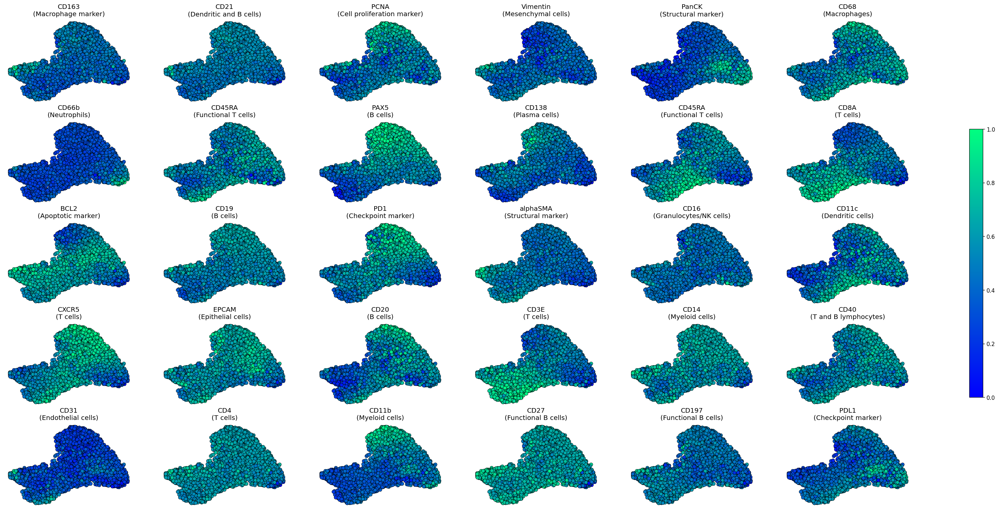

In [160]:
plot_umap_grid(a, proteins, pdata.var_names, type1)

In [161]:
proteins = model.impute(d11, A)
oracle_corr = np.mean([spearmanr(d12.detach().cpu().numpy()[:, ixs], proteins[:, ixs]).statistic for ixs in range(proteins.shape[1])])

In [162]:
pex_recons = output.pex_recons.data.cpu().numpy()

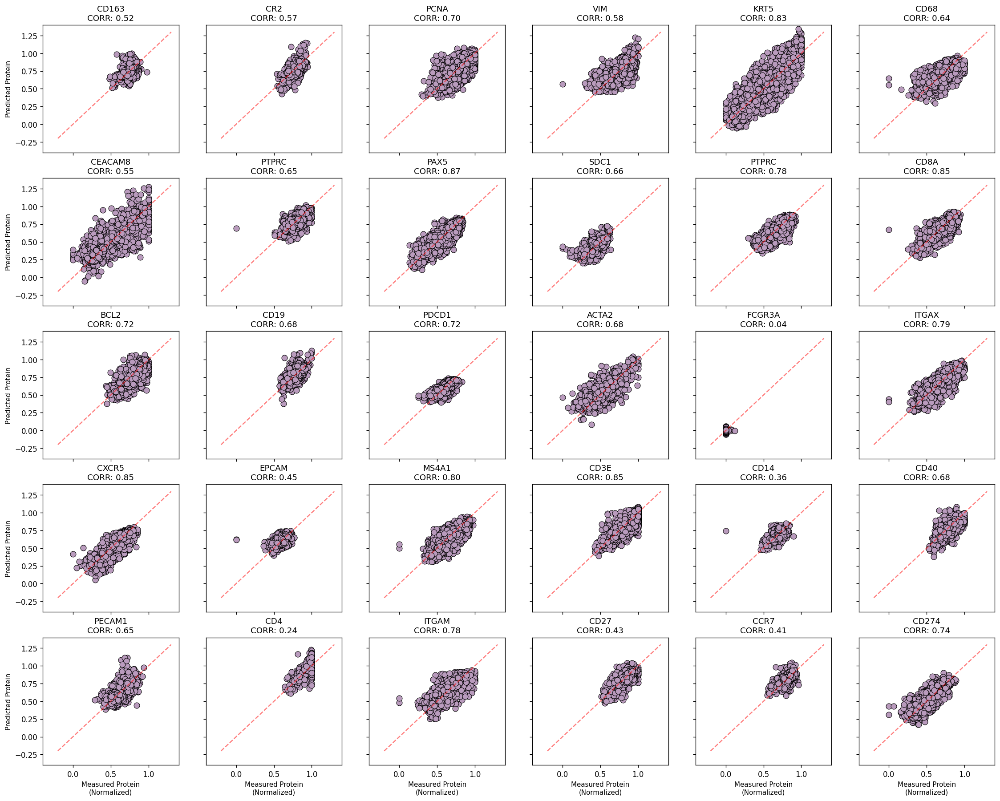

In [163]:
real = d12.detach().cpu().numpy()
f, axs = plt.subplots(5, 6, figsize=(23, 18), dpi=120, sharex=True, sharey=True)
axs = axs.flatten()
for ix, ax in enumerate(axs):
    # sns.scatterplot(x=real[:, ix], y=pex_recons[:, ix], ax=ax)
    ax.plot([-0.2, 1.3], [-0.2, 1.3], color='red', alpha=0.5, linestyle='--')
    
    sns.scatterplot(x=real[:, ix], y=proteins[:, ix], ax=ax, edgecolor='black', s=60, color=hex_colors[2])
    
    ax.set_xlim(-0.4, 1.4)
    ax.set_ylim(-0.4, 1.4)
    
    ax.set_title(f'{pdata.var_names[ix]}\nCORR: {spearmanr(real[:, ix], proteins[:, ix]).statistic:.2f}', fontsize=11)
    ax.set_xlabel('Measured Protein\n(Normalized)', fontsize=9)
    ax.set_ylabel('Predicted Protein', fontsize=9)
    
    
plt.show()

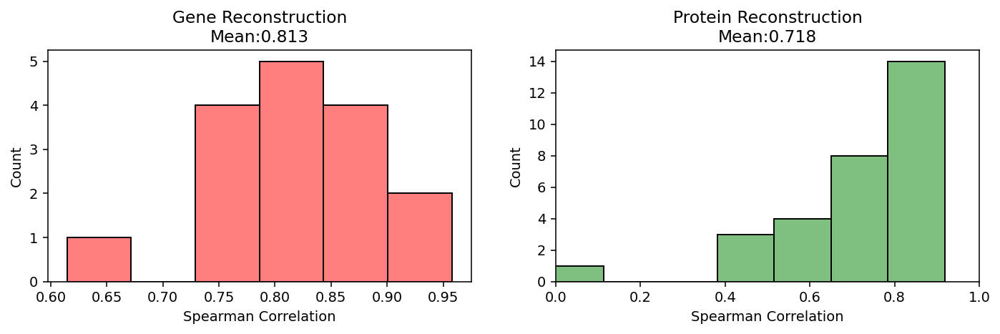

In [166]:
model = es.best_model
model.eval()
integrated_data =  model(X=[d11, d12], A=A)

plot_recons(integrated_data)

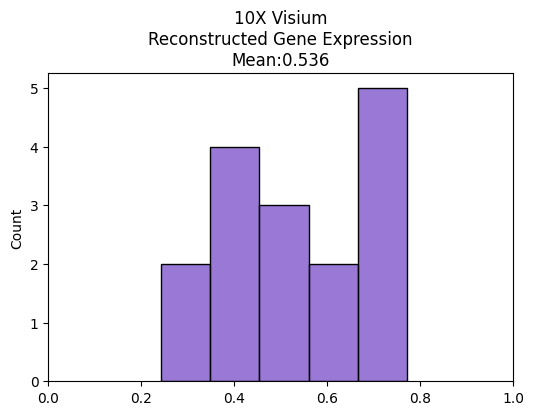

In [167]:
plt.rcParams['figure.figsize'] = [6, 4]

edge_index = gex2.adj_norm.to_dense().nonzero().t().contiguous()
gex2_z = model.fc_mus[0](model.encoders[0](d14, edge_index)[0], gex2.adj_norm.to_dense())
reconstructed_gex2 = model.decoders[0](gex2_z).detach().cpu().numpy()
gex2_z = gex2_z.detach().cpu().numpy()

b = d14.data.cpu().numpy()
corrs = []
for ixs in range(b.shape[1]):
    corrs.append(spearmanr(b[:, ixs], reconstructed_gex2[:, ixs]).statistic)  
sns.histplot(corrs, color=hex_colors[-2], label='TrainedModel')
plt.title(f'10X Visium\nReconstructed Gene Expression\nMean:{np.mean(corrs):.3f}')
plt.xlim(0, 1)
plt.show()

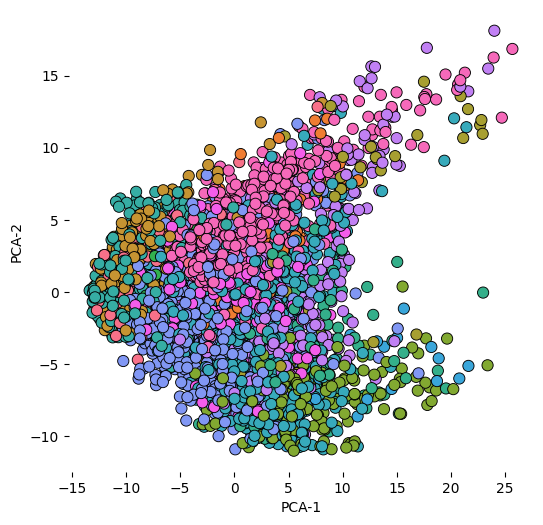

In [168]:
edge_index = A.nonzero().t().contiguous()
encoded, neg_z, summary = model.encoders[0](d11, edge_index)
encoded = encoded.detach().cpu().numpy()
plot_norm(encoded, labels=type1)

In [169]:
# model.eval()
# edge_index = At.nonzero().t().contiguous()
# encoded, neg_z, summary = model.encoders[0](d11t, edge_index)
# encoded = encoded.detach().cpu().numpy()
# z = np.random.multivariate_normal([0]*2, np.eye(2), len(type1[test_idx]))
# xy = PCA(2).fit_transform(encoded)
# plt.rcParams['figure.figsize'] = [6, 6]

# sns.scatterplot(x=z[:, 0], y=z[:, 1], color='grey', alpha=0.2, s=70)
# sns.scatterplot(x=xy[:, 0], y=xy[:, 1], hue=type1[test_idx], edgecolor='black', s=65, legend=False)
# sns.despine(left=True, bottom=True, trim=True, offset=10)
# plt.xlabel('PCA-1')
# plt.ylabel('PCA-2')
# plt.show()

In [170]:
# model.eval()
# integrated_data =  model(X=[d11t, d12t], A=At)
# gex_z = integrated_data.gex_z.data.cpu().numpy()
# pex_z = integrated_data.pex_z.data.cpu().numpy()

# a, b = plot_latent([gex_z, pex_z], [type1[test_idx], type2[test_idx]], 
#     legend=True, method='umap',
#     separate_dim=False, n_neighbors=200, size=300,
# );

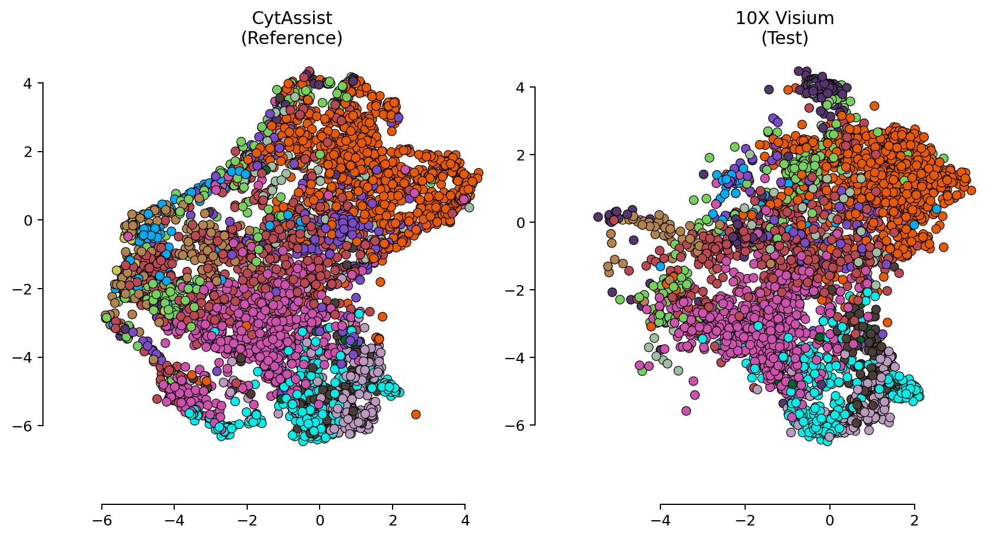

In [171]:
from sklearn.neighbors import KNeighborsClassifier

# adata2.obs['celltype'] = labels_10x
d14 = torch.tensor(adatax[adatax.obs.domain_id=='1'].obsm['latent']).cuda().float()
A14 = gex2.adj_norm.to_dense().float()

A = gex.adj_norm.to_dense()
data = adatax[adatax.obs.domain_id=='0']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A).detach().cpu().numpy()


data = adatax[adatax.obs.domain_id=='1']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A14.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
zx = model.fc_mus[0](pos_z, A14).detach().cpu().numpy()

f, axs = plt.subplots(1, 2, figsize=(11, 5), dpi=180)

A = gex.adj_norm.to_dense()
data = adatax[adatax.obs.domain_id=='0']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A).detach().cpu().numpy()

X_train = z
y_train = labels_cyt
knn = knn = KNeighborsClassifier(n_neighbors=3).fit(X_train, y_train)

red = cuml.UMAP(
        n_components=2,
        n_neighbors=100,
        min_dist=0.1,
        random_state=42
    )

red.fit(z);

plot_data = red.transform(z)
scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=labels_cyt, ax=axs[0], 
                          edgecolor='black', palette=dict(zip(type1.categories, hex_colors)), color='grey', legend=False)
ax = axs[0]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('CytAssist\n(Reference)')


data = adatax[adatax.obs.domain_id=='1']        
dx = torch.tensor(data.obsm['latent']).cuda().float()
edge_index = A14.nonzero().t().contiguous()
pos_z, neg_z, summary = model.encoders[0](dx, edge_index)
z = model.fc_mus[0](pos_z, A14).detach().cpu().numpy()

test_labels = knn.predict(z)

plot_data = red.transform(z)
scatter = sns.scatterplot(plot_data[:, 0], plot_data[:, 1], hue=test_labels, ax=axs[1], 
                          edgecolor='black', palette=dict(zip(type1.categories, hex_colors)), color='grey', legend=False)
ax = axs[1]
ax.spines['top'].set_visible(False)  # Hide the top spine
ax.spines['right'].set_visible(False)  # Hide the right spine
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
# ax.set_ylim(-10, 8)
# ax.set_xlim(-8, 8)
sns.despine(offset=30, trim=True, ax=ax)
ax.set_title('10X Visium\n(Test)')

# # plt.savefig('./figures/deconvolution_5.svg', format='svg', dpi=180)
plt.show()

In [172]:
adata2.uns['spatial'] = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX').uns['spatial']

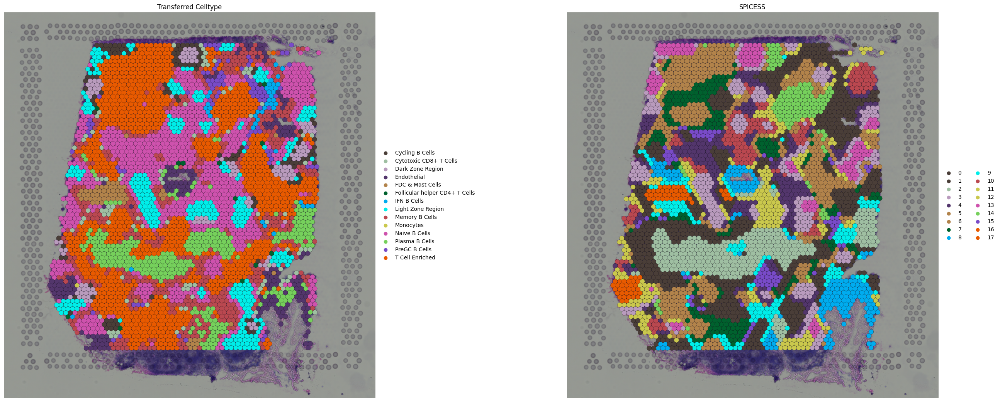

In [173]:
adata2.obs['celltype'] = test_labels
adata2.obs['celltype'] = adata2.obs['celltype'].astype('category')
# adata2.obs['celltype_extra'] = adata_10x.obs['celltype'].values.astype('category')

protein_preds = model.impute(dx, A14)
latent_gex = AnnData(protein_preds)
latent_gex.obsm['spatial'] = adata2.obsm['spatial']
latent_gex.uns['spatial'] = adata2.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)

resolution = 0.75
size = 1.65
linewidth = 0.2
img = True
alpha = 0.75

sc.tl.leiden(latent_gex, resolution=resolution)

adata2.obs['gex_z'] = latent_gex.obs.leiden.values

sq.pl.spatial_scatter(adata2, color=['celltype', 'gex_z'], size=size, title=['Transferred Celltype', 'SPICESS'],
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, img=img, shape='circle', palette=colors,
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(15, 13), 
                      dpi=100)

# plt.savefig('./figures/transferred.svg', format='svg', dpi=180)
plt.show()

In [1]:
a, b = plot_latent([gex_z, pex_z], [type1[train_idx], type2[train_idx]], 
    legend=True, method='umap',
    separate_dim=False, n_neighbors=300, reduce_only=True);

plt.rcParams['figure.figsize'] = [7, 7]

c1 = 'purple'
c2 = 'gold'

a_ = a[:50]
b_ = b[:50]
d = [euclidean_distance(ai, bi) for ai, bi in zip(a_, b_)]


size = 350
marker = 'o'

sns.scatterplot(b[:, 0], b[:, 1], color=c2, s=size, alpha=0.05, edgecolor='black', linewidth=1.5, legend=False)
sns.scatterplot(a[:, 0], a[:, 1], color=c1, s=size, alpha=0.05, edgecolor='black', linewidth=1.5, legend=False)

sns.scatterplot(b_[:, 0], b_[:, 1], label='Proteins', color=c2, s=size, alpha=1, edgecolor='black', linewidth=1, marker=marker, legend=False)
sns.scatterplot(a_[:, 0], a_[:, 1], label='Genes', color=c1, s=size, alpha=1, edgecolor='black', linewidth=1, marker=marker, legend=False)


matches = list(zip(range(len(a_)), range(len(b_))))
x1 = a_[:, 0]
y1 = a_[:, 1]
x2 = b_[:, 0]
y2 = b_[:, 1]

for i, j in matches:    
    plt.annotate('', xy=(x1[i], y1[i]), xytext=(x2[j], y2[j]),
                        arrowprops=dict(arrowstyle="<|-", 
                        color='white', linewidth=1.5,
                        connectionstyle="arc3, rad=-0.7",
                        fc="w"))
    
    plt.annotate(str(round(d[i], 2)), xy=(0.5*(x1[i]+x2[i]), 0.5*(y1[i]+y2[i])), 
                 color='white', ha='center', va='center', size=10)

plt.box(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
# plt.savefig('figures/example_alignment.svg', format='svg', dpi=180)
plt.show()

NameError: name 'plot_latent' is not defined

In [ ]:
%%time

adata = sc.read_visium(path=f'/ix/hosmanbeyoglu/kor11/CytAssist/{tissue}/GEX_PEX')
adata.obsm['spatial'] = adata.obsm['spatial'].astype(float)
adt_ref = pd.read_csv('/ix/hosmanbeyoglu/kor11/CytAssist/Brain/GEX_PEX/CytAssist_FFPE_Protein_Expression_Human_Glioblastoma_feature_reference.csv')
pdata = adata[:, [i in adt_ref[adt_ref.isotype_control==False].id.values for i in adata.var_names]]
adata = adata[:, [i not in adt_ref[adt_ref.isotype_control==False].id.values and 'MT-' not in i for i in adata.var_names]]
pdata.var.feature_types = 'Antibody Capture'
adata.obs['celltype'] = adata_ref.obs['celltype']

latent_gex = AnnData(gex_z)
latent_gex.obsm['spatial'] = adata.obsm['spatial']
latent_gex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_gex)
sc.pp.neighbors(latent_gex)


latent_pex = AnnData(pex_z)
latent_pex.obsm['spatial'] = adata.obsm['spatial']
latent_pex.uns['spatial'] = adata.uns['spatial']
sc.tl.pca(latent_pex)
sc.pp.neighbors(latent_pex)


pdata.obsm['spatial'] = adata.obsm['spatial']
sc.tl.pca(adata)
sc.pp.neighbors(adata)

sc.tl.pca(pdata)
sc.pp.neighbors(pdata)

CPU times: user 37.5 s, sys: 1min 43s, total: 2min 21s
Wall time: 34.6 s


In [ ]:
resolution = 1.0
size = 1.5
linewidth = 0.2
img = True
alpha = 0.75

sc.tl.leiden(adata, resolution=resolution)
sc.tl.leiden(pdata, resolution=resolution)
sc.tl.leiden(latent_gex, resolution=resolution)
sc.tl.leiden(latent_pex, resolution=resolution)

adata.obs['gex_z'] = latent_gex.obs.leiden.values
adata.obs['pex_z'] = latent_pex.obs.leiden.values
adata.obs['protein'] = pdata.obs.leiden.values
adata.obs['mrna'] = adata.obs.leiden.values

In [ ]:
resolution = 1.0
size = 1.5
linewidth = 0.2
img = True
alpha = 0.75

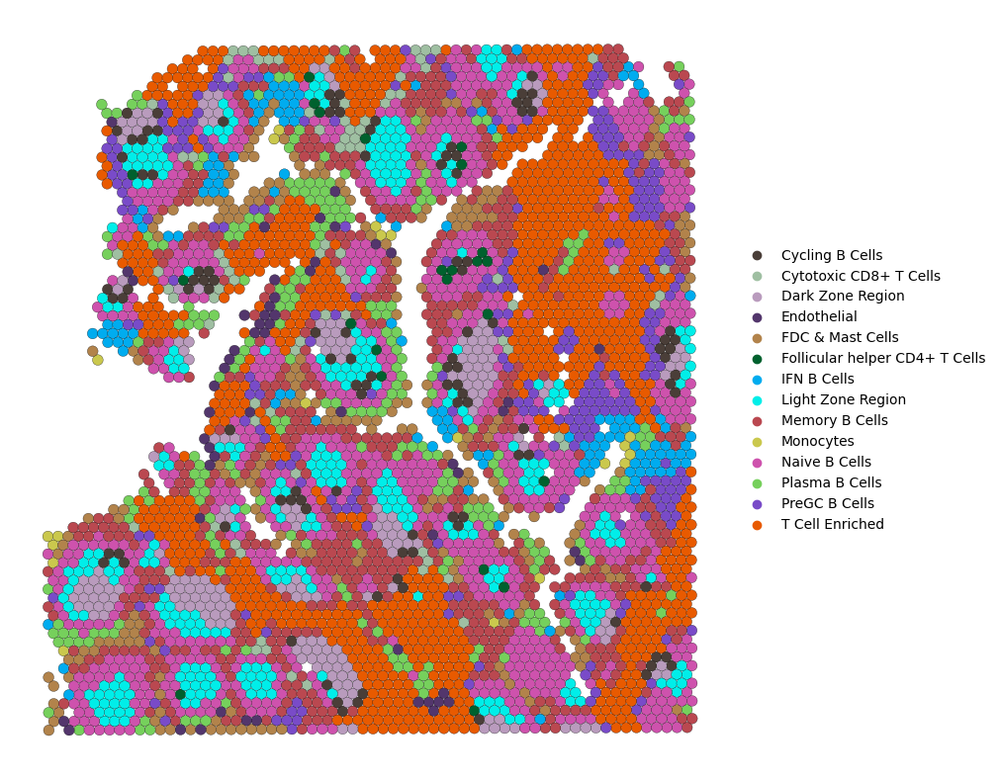

In [42]:
sq.pl.spatial_scatter(adata, color=['celltype'], size=size, title='',
                      edgecolor='black', linewidth=linewidth, frameon=False, 
                      alpha=1, palette=colors, img=False, shape='circle', 
                      crop_coord=tuple([0, 0, 28000, 40000]), figsize=(10, 10), 
                      dpi=100)
plt.savefig('./figures/cell2location.svg', format='svg', dpi=180, transparent=True)
plt.show()